# Train a JointVAE model

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import torch

use_cuda = torch.cuda.is_available()
use_cuda

True

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"  # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"] = "1"  # change to your device

#### Prepare data list

In [4]:
!ls data

dress_dresslen_train_test_splits.json	loadable_women_primary_dress.csv
dress_sleevelen_train_test_splits.json	rayimages.ipynb
dress_sleeve_train_test_splits.json


#### dress sleeve data

In [5]:
import json
with open("./data/dress_sleeve_train_test_splits.json", "r") as infile:
    data_dict = json.load(infile)
    
data_dict.keys()

dict_keys(['X_train_1', 'y_train_1', 'X_test_1', 'y_test_1', 'X_train_2', 'y_train_2', 'X_test_2', 'y_test_2', 'X_train_3', 'y_train_3', 'X_test_3', 'y_test_3', 'X_train_4', 'y_train_4', 'X_test_4', 'y_test_4', 'X_train_5', 'y_train_5', 'X_test_5', 'y_test_5', 'X_train_6', 'y_train_6', 'X_test_6', 'y_test_6', 'X_train_7', 'y_train_7', 'X_test_7', 'y_test_7', 'X_train_8', 'y_train_8', 'X_test_8', 'y_test_8', 'X_train_9', 'y_train_9', 'X_test_9', 'y_test_9', 'X_train_10', 'y_train_10', 'X_test_10', 'y_test_10'])

In [6]:
image_paths_train = []
image_paths_test = []

root_data_dir = "/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables"

for key, val in data_dict.items():
    if 'X_train' in key:
        image_paths_train.extend([root_data_dir + imgpath for imgpath in val])
    elif 'X_test' in key:
        image_paths_test.extend([root_data_dir + imgpath for imgpath in val])

print(f"Number of train image paths: {len(image_paths_train):,d}")
print(f"Number of test image paths: {len(image_paths_test):,d}")
print()
print("Sample paths:")
print(image_paths_train[0])
print(image_paths_train[-1])
print(image_paths_test[0])
print(image_paths_test[-1])

Number of train image paths: 207,603
Number of test image paths: 23,067

Sample paths:
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/8/2893552_3773662.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2713940_3640098.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/8/2856150_3749586.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/3/0/3058817_8191784.jpg


#### loadable dresses data

### Create data loaders

In [7]:
from torchvision import transforms
from utils.dataloader_tools import get_imagelist_dataloader, ImageListDataset

BATCH_SIZE = 128

composed = transforms.Compose([transforms.CenterCrop((256,256)),transforms.Resize((256,256)),transforms.ToTensor()])

# convert rgb is for the cv2 loaded images that I've got in this dir
train_dataset = ImageListDataset(image_paths_train, cut_from='top', cut_amount=256, transform=composed, 
                                 convert_rgb=False, error_handling=True)
test_dataset = ImageListDataset(image_paths_test, cut_from='top', cut_amount=256, transform=composed, 
                                convert_rgb=False, error_handling=True)

train_loader = get_imagelist_dataloader(batch_size=BATCH_SIZE, dataset_object=train_dataset)
test_loader = get_imagelist_dataloader(batch_size=BATCH_SIZE, dataset_object=test_dataset)

### Define latent distribution of the model

In [8]:
# Latent distribution will be joint distribution of 10 gaussian normal distributions
# and one 10 dimensional Gumbel Softmax distribution
latent_spec = {'cont': 20, 'disc': [10, 10, 10]}

### Build a model

In [9]:
from jointvae.models_256_convjump2bn import VAE

model = VAE(latent_spec=latent_spec, hidden_dim=512, img_size=(3, 256, 256), use_cuda=use_cuda)

In [10]:
#print(model)

### Train the model

In [11]:
from torch import optim

# Build optimizer
optimizer = optim.Adam(model.parameters(), lr=3e-4, amsgrad=True) # added amsgrad # orig lr 5e-4

In [12]:
from jointvae.training import Trainer
#from jointvae.training_debug import Trainer

# Define the capacities
# Continuous channels
cont_capacity = [0.0, 6, 25000, 36.0]  # Starting at a capacity of 0.0, increase this to 5.0
                                         # over 25000 iterations with a gamma of 30.0
# Discrete channels
disc_capacity = [0.0, 6, 25000, 36.0]  # Starting at a capacity of 0.0, increase this to 5.0
                                         # over 25000 iterations with a gamma of 30.0

# Build a trainer
trainer = Trainer(model, optimizer,
                  cont_capacity=cont_capacity,
                  disc_capacity=disc_capacity,
                 use_cuda=use_cuda)

#### Initialize visualizer

In [13]:
#from viz.visualize import Visualizer
from viz.visualize import Visualizer

viz = Visualizer(model)
viz.save_images = False # needed to add this so it returns a tensor

In [14]:
# Note this should be at least 100 epochs for proper training or more but can be less to demo

trainer.train(train_loader, epochs=170, save_training_gif=None)

0/207603	Loss: 45452.914
6400/207603	Loss: 44452.103
12800/207603	Loss: 33048.619
19200/207603	Loss: 26419.228
25600/207603	Loss: 20351.171
32000/207603	Loss: 18320.226
38400/207603	Loss: 17522.906
44800/207603	Loss: 17057.964
51200/207603	Loss: 16950.145
57600/207603	Loss: 16650.557
64000/207603	Loss: 16545.720
70400/207603	Loss: 16518.254
76800/207603	Loss: 16439.822
83200/207603	Loss: 16412.956
89600/207603	Loss: 16291.992
96000/207603	Loss: 16202.278
102400/207603	Loss: 16154.198
108800/207603	Loss: 16206.841
115200/207603	Loss: 16194.733
121600/207603	Loss: 16060.838
128000/207603	Loss: 15871.125
134400/207603	Loss: 15958.386
140800/207603	Loss: 15957.966
147200/207603	Loss: 15941.128
153600/207603	Loss: 15931.446
160000/207603	Loss: 15987.317
166400/207603	Loss: 15769.993
172800/207603	Loss: 15795.981
179200/207603	Loss: 15862.265
185600/207603	Loss: 15823.968
192000/207603	Loss: 15808.902
198400/207603	Loss: 15638.893
204800/207603	Loss: 15668.000
Epoch: 1 Average loss: 18105.38

51200/207603	Loss: 14810.798
57600/207603	Loss: 14834.307
64000/207603	Loss: 14889.634
70400/207603	Loss: 14879.599
76800/207603	Loss: 14728.026
83200/207603	Loss: 14760.567
89600/207603	Loss: 14807.157
96000/207603	Loss: 14791.924
102400/207603	Loss: 14859.916
108800/207603	Loss: 14815.619
115200/207603	Loss: 14837.966
121600/207603	Loss: 14737.154
128000/207603	Loss: 14836.455
134400/207603	Loss: 14825.997
140800/207603	Loss: 14853.927
147200/207603	Loss: 14879.178
153600/207603	Loss: 14804.697
160000/207603	Loss: 14846.099
166400/207603	Loss: 14782.745
172800/207603	Loss: 14828.287
179200/207603	Loss: 14840.328
185600/207603	Loss: 14844.172
192000/207603	Loss: 14882.924
198400/207603	Loss: 14823.472
204800/207603	Loss: 14855.644
Epoch: 9 Average loss: 14836.61
0/207603	Loss: 14642.856
6400/207603	Loss: 14885.800
12800/207603	Loss: 14840.892
19200/207603	Loss: 14805.323
25600/207603	Loss: 14760.770
32000/207603	Loss: 14796.946
38400/207603	Loss: 14740.219
44800/207603	Loss: 14768.956

96000/207603	Loss: 14563.991
102400/207603	Loss: 14497.922
108800/207603	Loss: 14555.762
115200/207603	Loss: 14491.348
121600/207603	Loss: 14585.500
128000/207603	Loss: 14493.692
134400/207603	Loss: 14591.651
140800/207603	Loss: 14553.698
147200/207603	Loss: 14568.775
153600/207603	Loss: 14587.069
160000/207603	Loss: 14520.234
166400/207603	Loss: 14480.540
172800/207603	Loss: 14649.135
179200/207603	Loss: 14476.769
185600/207603	Loss: 14571.380
192000/207603	Loss: 14559.976
198400/207603	Loss: 14549.970
204800/207603	Loss: 14608.064
Epoch: 17 Average loss: 14560.88
0/207603	Loss: 14191.816
6400/207603	Loss: 14565.329
12800/207603	Loss: 14591.182
19200/207603	Loss: 14558.698
25600/207603	Loss: 14612.934
32000/207603	Loss: 14617.903
38400/207603	Loss: 14612.009
44800/207603	Loss: 14669.188
51200/207603	Loss: 14526.835
57600/207603	Loss: 14530.664
64000/207603	Loss: 14499.148
70400/207603	Loss: 14502.163
76800/207603	Loss: 14541.636
83200/207603	Loss: 14472.184
89600/207603	Loss: 14552.61

147200/207603	Loss: 14290.541
153600/207603	Loss: 14300.456
160000/207603	Loss: 14359.983
166400/207603	Loss: 14307.899
172800/207603	Loss: 14312.283
179200/207603	Loss: 14291.459
185600/207603	Loss: 14240.128
192000/207603	Loss: 14268.427
198400/207603	Loss: 14366.161
204800/207603	Loss: 14378.596
Epoch: 25 Average loss: 14306.21
0/207603	Loss: 14795.636
6400/207603	Loss: 14327.702
12800/207603	Loss: 14261.641
19200/207603	Loss: 14238.778
25600/207603	Loss: 14297.216
32000/207603	Loss: 14282.861
38400/207603	Loss: 14342.443
44800/207603	Loss: 14320.850
51200/207603	Loss: 14261.019
57600/207603	Loss: 14283.896
64000/207603	Loss: 14304.220
70400/207603	Loss: 14273.784
76800/207603	Loss: 14251.419
83200/207603	Loss: 14354.479
89600/207603	Loss: 14322.851
96000/207603	Loss: 14379.222
102400/207603	Loss: 14290.729
108800/207603	Loss: 14281.040
115200/207603	Loss: 14256.148
121600/207603	Loss: 14290.732
128000/207603	Loss: 14264.962
134400/207603	Loss: 14336.859
140800/207603	Loss: 14302.20

185600/207603	Loss: 14230.632
192000/207603	Loss: 14265.136
198400/207603	Loss: 14196.790
204800/207603	Loss: 14212.471
Epoch: 33 Average loss: 14244.43
0/207603	Loss: 14413.455
6400/207603	Loss: 14239.285
12800/207603	Loss: 14288.367
19200/207603	Loss: 14314.321
25600/207603	Loss: 14255.079
32000/207603	Loss: 14189.414
38400/207603	Loss: 14184.047
44800/207603	Loss: 14243.763
51200/207603	Loss: 14229.364
57600/207603	Loss: 14254.705
64000/207603	Loss: 14162.735
70400/207603	Loss: 14214.773
76800/207603	Loss: 14210.792
83200/207603	Loss: 14214.341
89600/207603	Loss: 14175.363
96000/207603	Loss: 14209.922
102400/207603	Loss: 14272.131
108800/207603	Loss: 14194.628
115200/207603	Loss: 14285.934
121600/207603	Loss: 14189.245
128000/207603	Loss: 14339.587
134400/207603	Loss: 14222.941
140800/207603	Loss: 14223.798
147200/207603	Loss: 14288.983
153600/207603	Loss: 14101.314
160000/207603	Loss: 14321.876
166400/207603	Loss: 14167.287
172800/207603	Loss: 14194.410
179200/207603	Loss: 14304.27

6400/207603	Loss: 14194.016
12800/207603	Loss: 14181.256
19200/207603	Loss: 14151.445
25600/207603	Loss: 14258.704
32000/207603	Loss: 14140.364
38400/207603	Loss: 14202.079
44800/207603	Loss: 14237.336
51200/207603	Loss: 14227.368
57600/207603	Loss: 14124.169
64000/207603	Loss: 14190.720
70400/207603	Loss: 14134.667
76800/207603	Loss: 14237.064
83200/207603	Loss: 14263.726
89600/207603	Loss: 14224.490
96000/207603	Loss: 14205.944
102400/207603	Loss: 14231.866
108800/207603	Loss: 14170.511
115200/207603	Loss: 14128.130
121600/207603	Loss: 14133.653
128000/207603	Loss: 14191.735
134400/207603	Loss: 14164.444
140800/207603	Loss: 14208.368
147200/207603	Loss: 14212.025
153600/207603	Loss: 14188.312
160000/207603	Loss: 14217.343
166400/207603	Loss: 14202.165
172800/207603	Loss: 14248.013
179200/207603	Loss: 14059.005
185600/207603	Loss: 14158.100
192000/207603	Loss: 14263.854
198400/207603	Loss: 14218.632
204800/207603	Loss: 14137.421
Epoch: 42 Average loss: 14190.67
0/207603	Loss: 13972.62

51200/207603	Loss: 14202.759
57600/207603	Loss: 14135.468
64000/207603	Loss: 14125.254
70400/207603	Loss: 14176.427
76800/207603	Loss: 14119.188
83200/207603	Loss: 14108.750
89600/207603	Loss: 14097.566
96000/207603	Loss: 14167.662
102400/207603	Loss: 14189.872
108800/207603	Loss: 14135.844
115200/207603	Loss: 14126.245
121600/207603	Loss: 14171.810
128000/207603	Loss: 14063.289
134400/207603	Loss: 14170.307
140800/207603	Loss: 14190.743
147200/207603	Loss: 14166.335
153600/207603	Loss: 14203.397
160000/207603	Loss: 14180.001
166400/207603	Loss: 14140.570
172800/207603	Loss: 14127.548
179200/207603	Loss: 14128.070
185600/207603	Loss: 14114.080
192000/207603	Loss: 14084.003
198400/207603	Loss: 14247.664
204800/207603	Loss: 14106.921
Epoch: 50 Average loss: 14155.29
0/207603	Loss: 14094.713
6400/207603	Loss: 14118.043
12800/207603	Loss: 14188.642
19200/207603	Loss: 14099.853
25600/207603	Loss: 14236.474
32000/207603	Loss: 14133.844
38400/207603	Loss: 14138.640
44800/207603	Loss: 14105.32

102400/207603	Loss: 14059.380
108800/207603	Loss: 14061.249
115200/207603	Loss: 14217.271
121600/207603	Loss: 14061.777
128000/207603	Loss: 14187.948
134400/207603	Loss: 14138.904
140800/207603	Loss: 14126.699
147200/207603	Loss: 14144.943
153600/207603	Loss: 14129.294
160000/207603	Loss: 14105.241
166400/207603	Loss: 14159.442
172800/207603	Loss: 14064.949
179200/207603	Loss: 14213.281
185600/207603	Loss: 14142.093
192000/207603	Loss: 14086.242
198400/207603	Loss: 14135.433
204800/207603	Loss: 14128.377
Epoch: 58 Average loss: 14126.91
0/207603	Loss: 13812.138
6400/207603	Loss: 14091.206
12800/207603	Loss: 14138.437
25600/207603	Loss: 14108.268
32000/207603	Loss: 14129.979
38400/207603	Loss: 14167.539
44800/207603	Loss: 14104.658
51200/207603	Loss: 14079.217
57600/207603	Loss: 14143.129
64000/207603	Loss: 14152.236
70400/207603	Loss: 14093.779
76800/207603	Loss: 14152.179
83200/207603	Loss: 14195.740
89600/207603	Loss: 14104.834
96000/207603	Loss: 14109.395
102400/207603	Loss: 14161.9

147200/207603	Loss: 14039.544
153600/207603	Loss: 14054.569
160000/207603	Loss: 14152.371
166400/207603	Loss: 14109.028
172800/207603	Loss: 14024.221
179200/207603	Loss: 14104.920
185600/207603	Loss: 14060.092
192000/207603	Loss: 14105.221
198400/207603	Loss: 14069.593
204800/207603	Loss: 14125.583
Epoch: 66 Average loss: 14102.79
0/207603	Loss: 14386.364
6400/207603	Loss: 14041.400
12800/207603	Loss: 14144.638
19200/207603	Loss: 14016.584
25600/207603	Loss: 14131.640
32000/207603	Loss: 14206.732
38400/207603	Loss: 14165.877
44800/207603	Loss: 14107.810
51200/207603	Loss: 14085.459
57600/207603	Loss: 14158.003
64000/207603	Loss: 14031.729
70400/207603	Loss: 14117.833
76800/207603	Loss: 14029.919
83200/207603	Loss: 14049.203
89600/207603	Loss: 14068.968
96000/207603	Loss: 14123.076
102400/207603	Loss: 14094.453
108800/207603	Loss: 14019.733
115200/207603	Loss: 14110.084
121600/207603	Loss: 14081.492
128000/207603	Loss: 14123.834
134400/207603	Loss: 14180.721
140800/207603	Loss: 14172.75

185600/207603	Loss: 14070.298
192000/207603	Loss: 14100.387
198400/207603	Loss: 14126.861
204800/207603	Loss: 14033.340
Epoch: 74 Average loss: 14080.22
0/207603	Loss: 14219.102
6400/207603	Loss: 14165.372
12800/207603	Loss: 14001.946
19200/207603	Loss: 14059.468
25600/207603	Loss: 14021.932
32000/207603	Loss: 14110.543
38400/207603	Loss: 14086.135
44800/207603	Loss: 14054.020
51200/207603	Loss: 14157.497
57600/207603	Loss: 14083.362
64000/207603	Loss: 14080.188
70400/207603	Loss: 14047.114
76800/207603	Loss: 14125.789
83200/207603	Loss: 14060.360
89600/207603	Loss: 14137.568
96000/207603	Loss: 14084.072
102400/207603	Loss: 14119.237
108800/207603	Loss: 13996.214
115200/207603	Loss: 13966.861
121600/207603	Loss: 14090.991
128000/207603	Loss: 14022.982
134400/207603	Loss: 14096.026
140800/207603	Loss: 14025.821
147200/207603	Loss: 14043.561
153600/207603	Loss: 14086.228
160000/207603	Loss: 14096.930
166400/207603	Loss: 14074.193
172800/207603	Loss: 14098.230
179200/207603	Loss: 14122.05

6400/207603	Loss: 14081.230
12800/207603	Loss: 14044.072
19200/207603	Loss: 14022.944
25600/207603	Loss: 14134.770
32000/207603	Loss: 14114.922
38400/207603	Loss: 14111.099
44800/207603	Loss: 14108.762
51200/207603	Loss: 14150.395
57600/207603	Loss: 14033.901
64000/207603	Loss: 14061.372
70400/207603	Loss: 14048.186
76800/207603	Loss: 14027.068
83200/207603	Loss: 13971.581
89600/207603	Loss: 14034.517
96000/207603	Loss: 14088.368
102400/207603	Loss: 14044.696
108800/207603	Loss: 14114.580
115200/207603	Loss: 14025.201
121600/207603	Loss: 14025.577
128000/207603	Loss: 14023.204
134400/207603	Loss: 14123.570
140800/207603	Loss: 14030.006
147200/207603	Loss: 14106.316
153600/207603	Loss: 14046.690
160000/207603	Loss: 14057.867
166400/207603	Loss: 14045.498
172800/207603	Loss: 14005.888
179200/207603	Loss: 14108.920
185600/207603	Loss: 14030.482
192000/207603	Loss: 13965.284
198400/207603	Loss: 14051.077
204800/207603	Loss: 14013.992
Epoch: 83 Average loss: 14059.13
0/207603	Loss: 13434.11

KeyboardInterrupt: 

In [ ]:
print('Done Training')

In [ ]:
print("Testing system")

In [15]:
save_image_path = "sample_images/305/256"
model_name = "cj2_e89_b128_c20d10-10-10_cmax6_gam36"

### Visualize

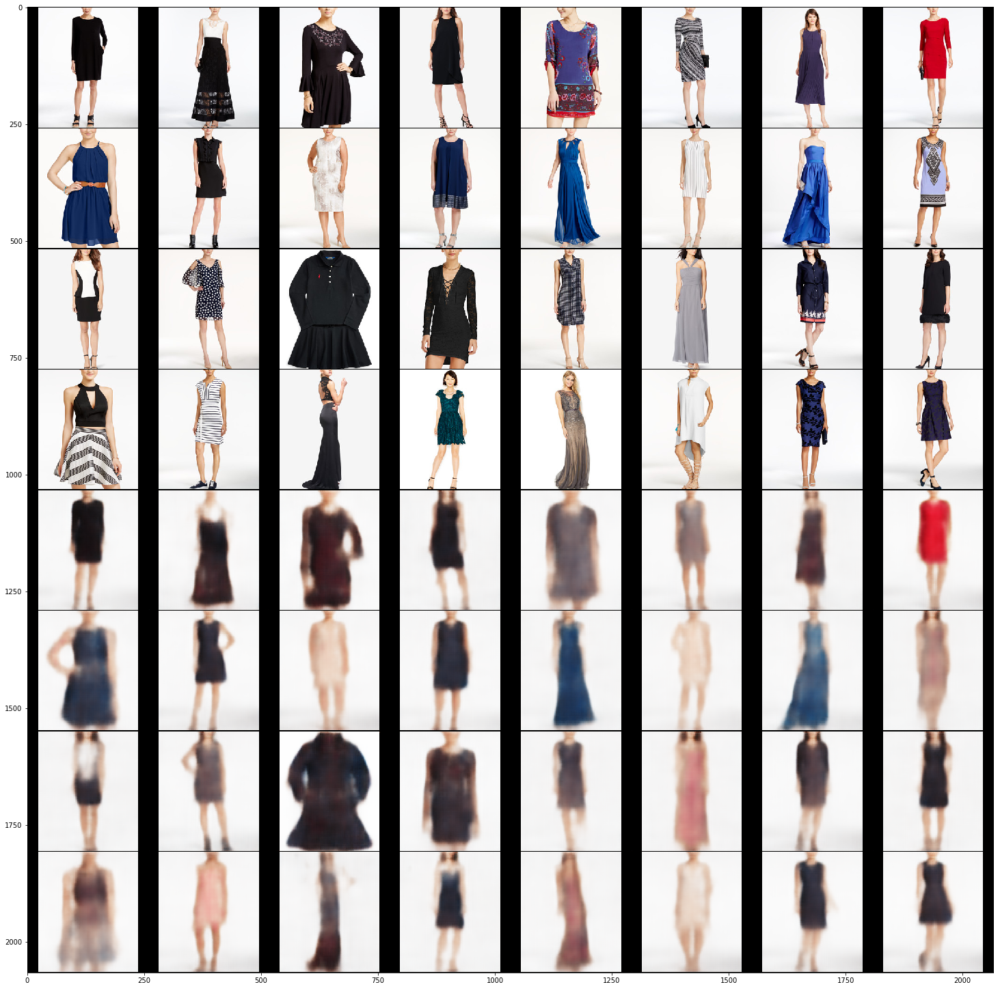

In [16]:
# Plot reconstructions
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Get a batch of data
for batch, labels in test_loader:
    break

# Reconstruct data using Joint-VAE model
recon = viz.reconstructions(batch)

plt.figure(figsize=(26,26))
plt.imshow(np.rot90(np.transpose(recon.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_reconstructions.png",dpi=200)

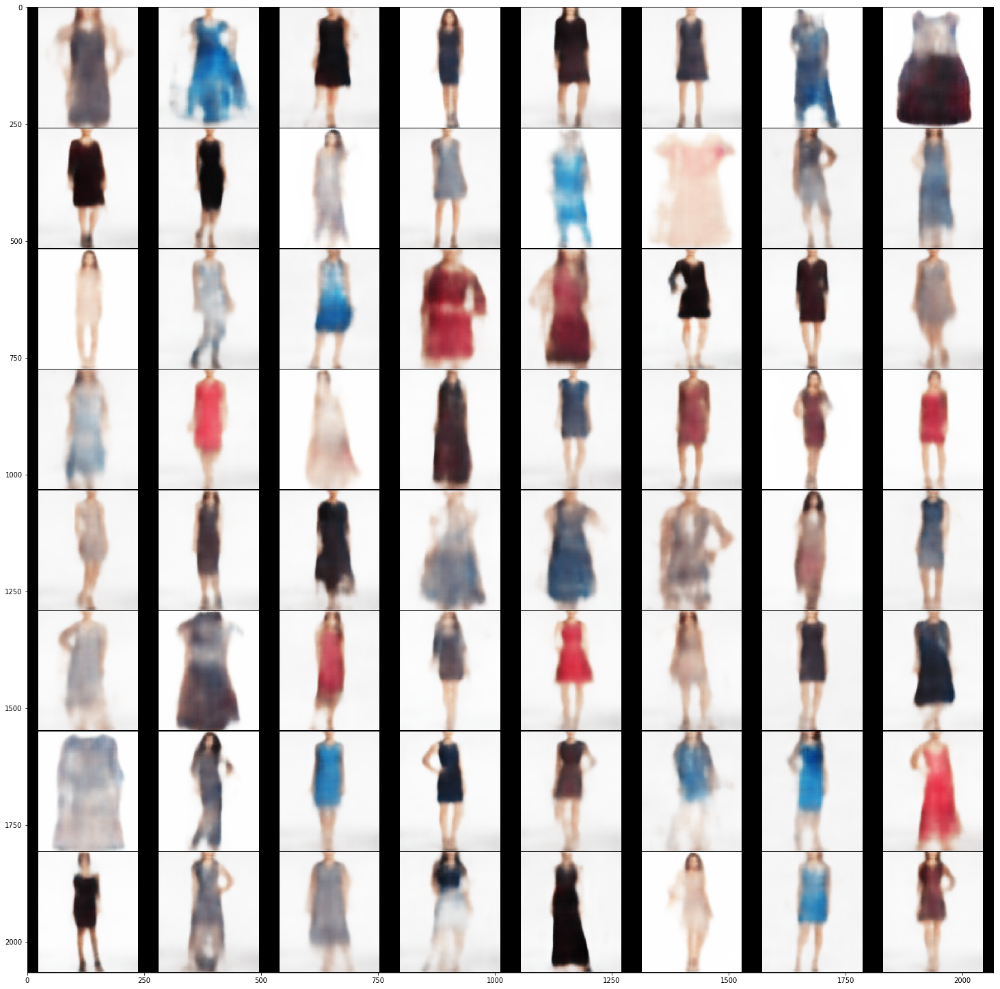

In [17]:
# Plot samples
samples = viz.samples()

plt.figure(figsize=(26,26))
plt.imshow(np.rot90(np.transpose(samples.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_samples.png",dpi=200)

### Note on Traversals

### Traverses all latent dimensions one by one and plots a grid of images where each row corresponds to a latent traversal of one latent dimension
* size: Number of samples for each latent traversal.

In [18]:
print(viz.model.latent_cont_dim, viz.model.num_disc_latents)

20 3


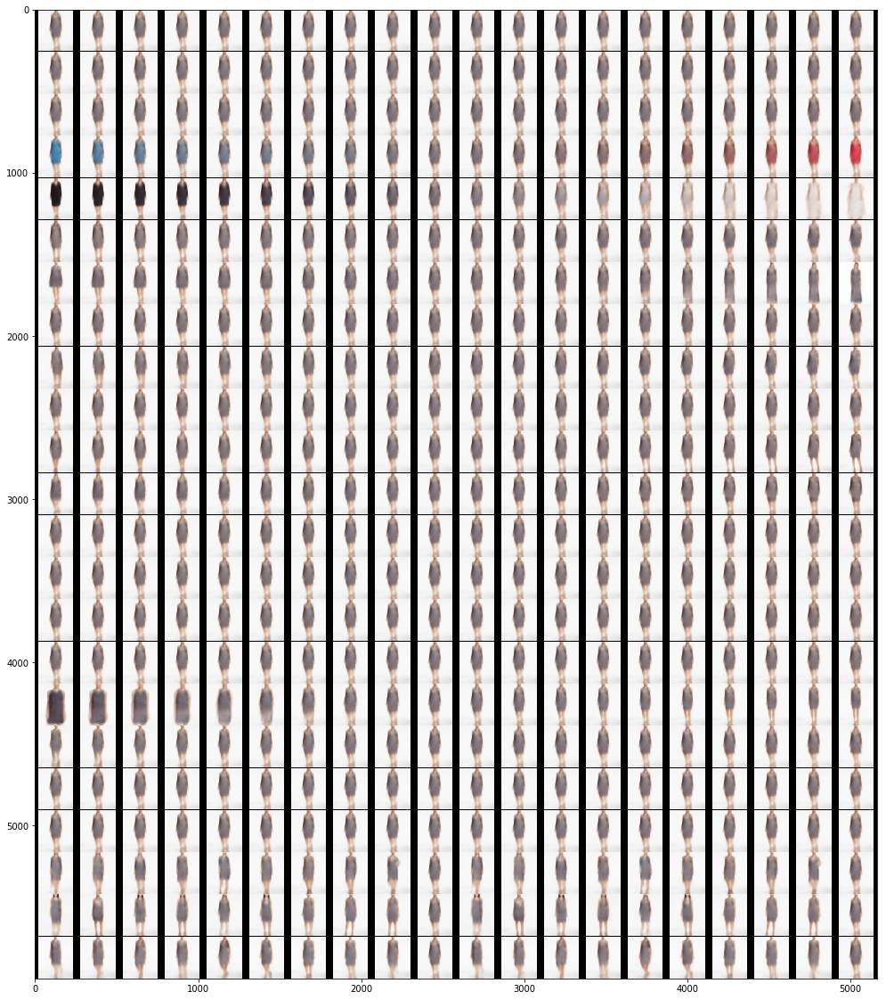

In [19]:
# Plot all traversals
traversals = viz.all_latent_traversals(size=20)

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_all_traversals_n20.png",dpi=200)

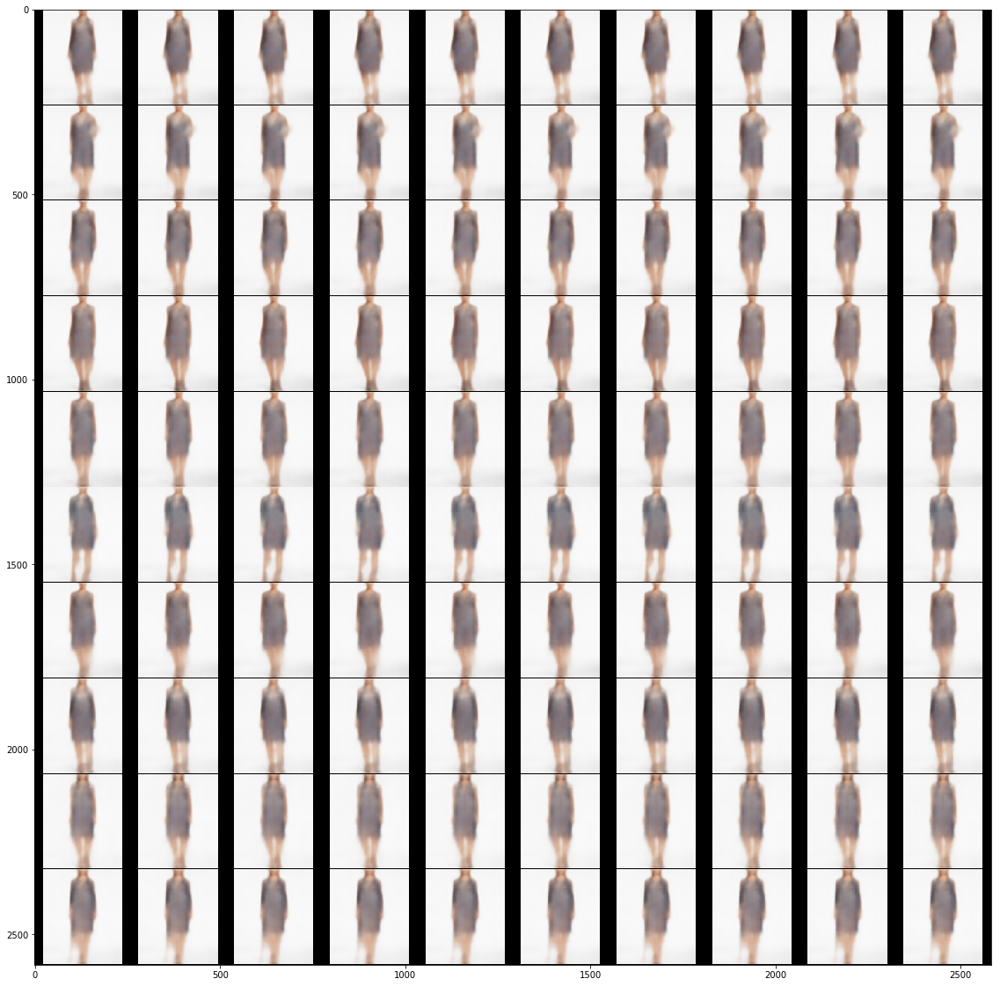

In [20]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals2100.png",dpi=200)

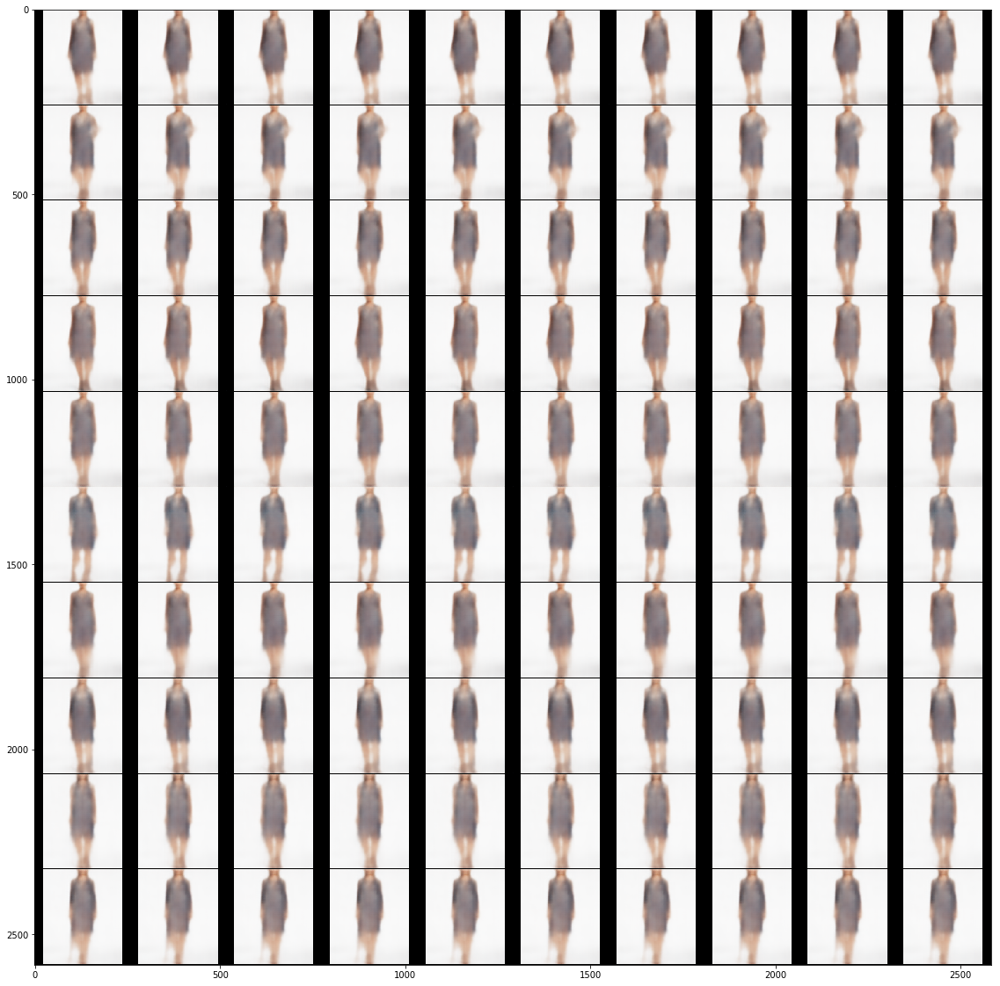

In [21]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=1, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(traversals.numpy()[0, :, :]);
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals1100.png",dpi=200)

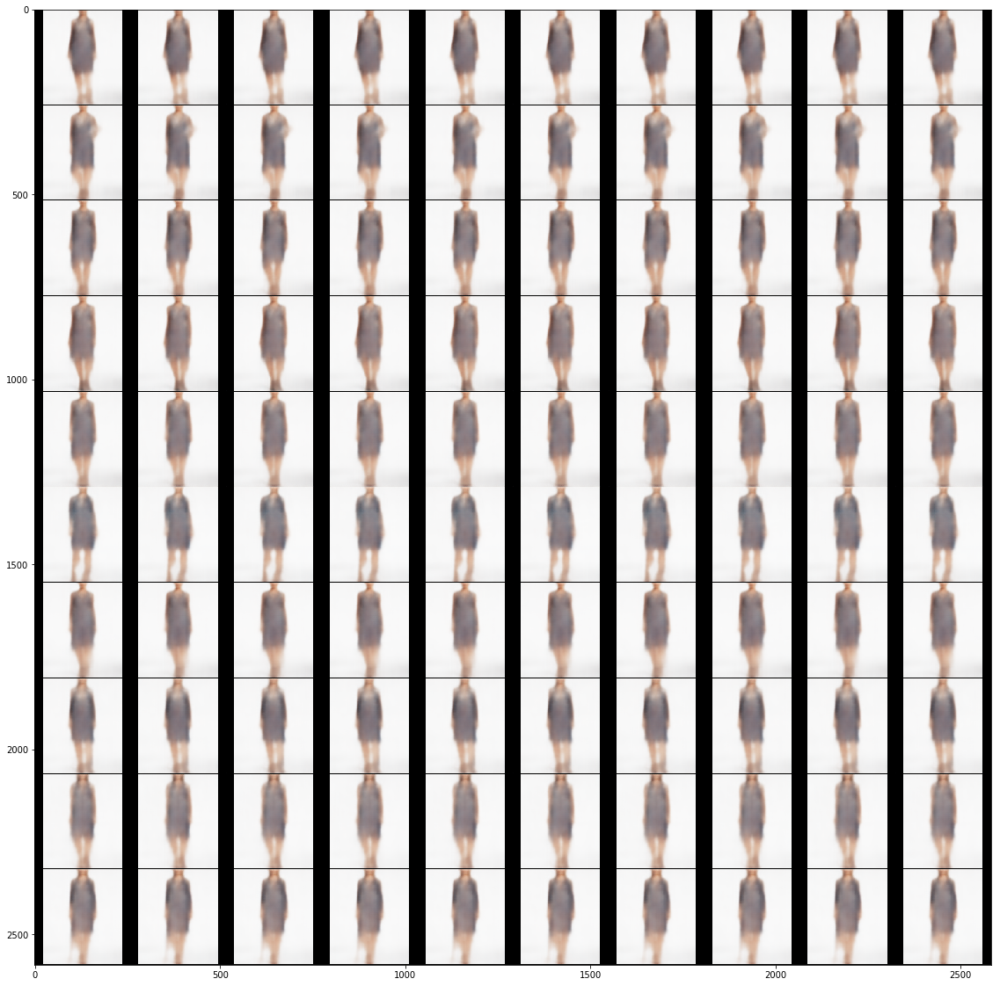

In [22]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=9, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals9100.png",dpi=200)

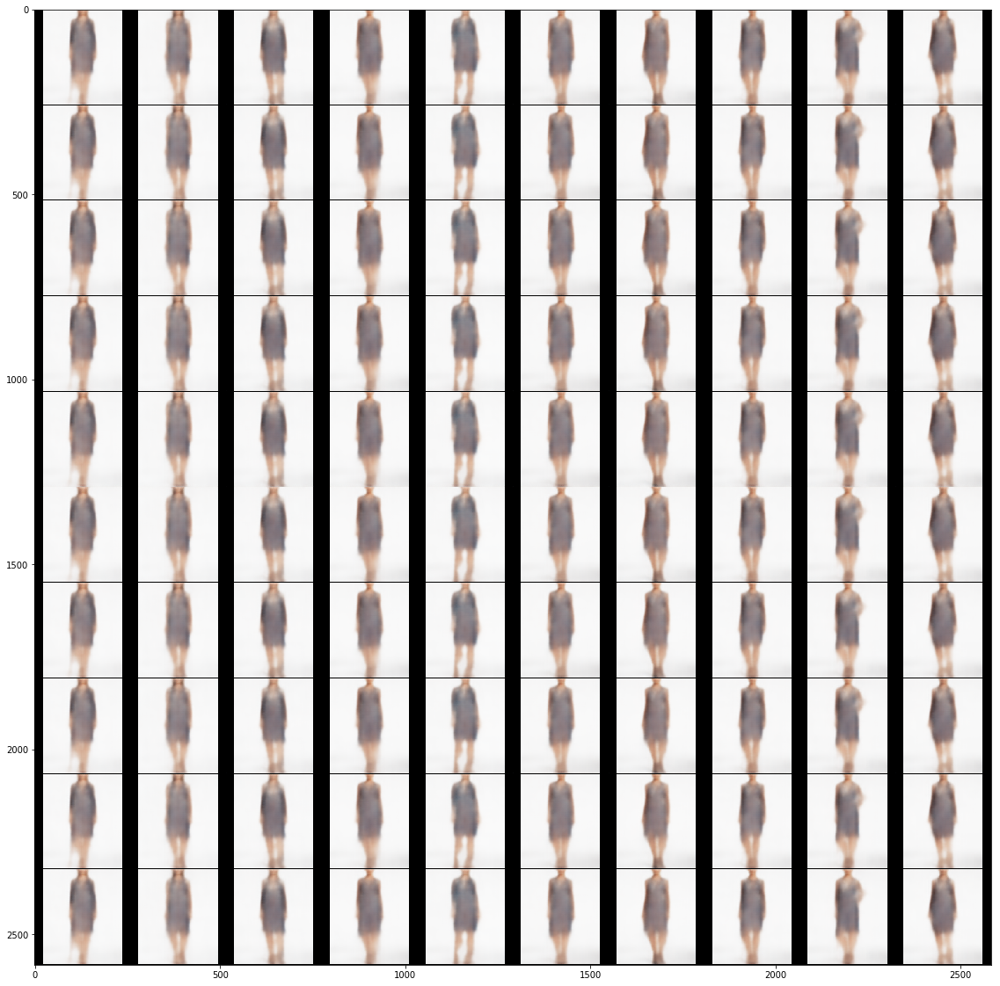

In [23]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=1, disc_idx=0, disc_axis=1, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals2101.png",dpi=200)

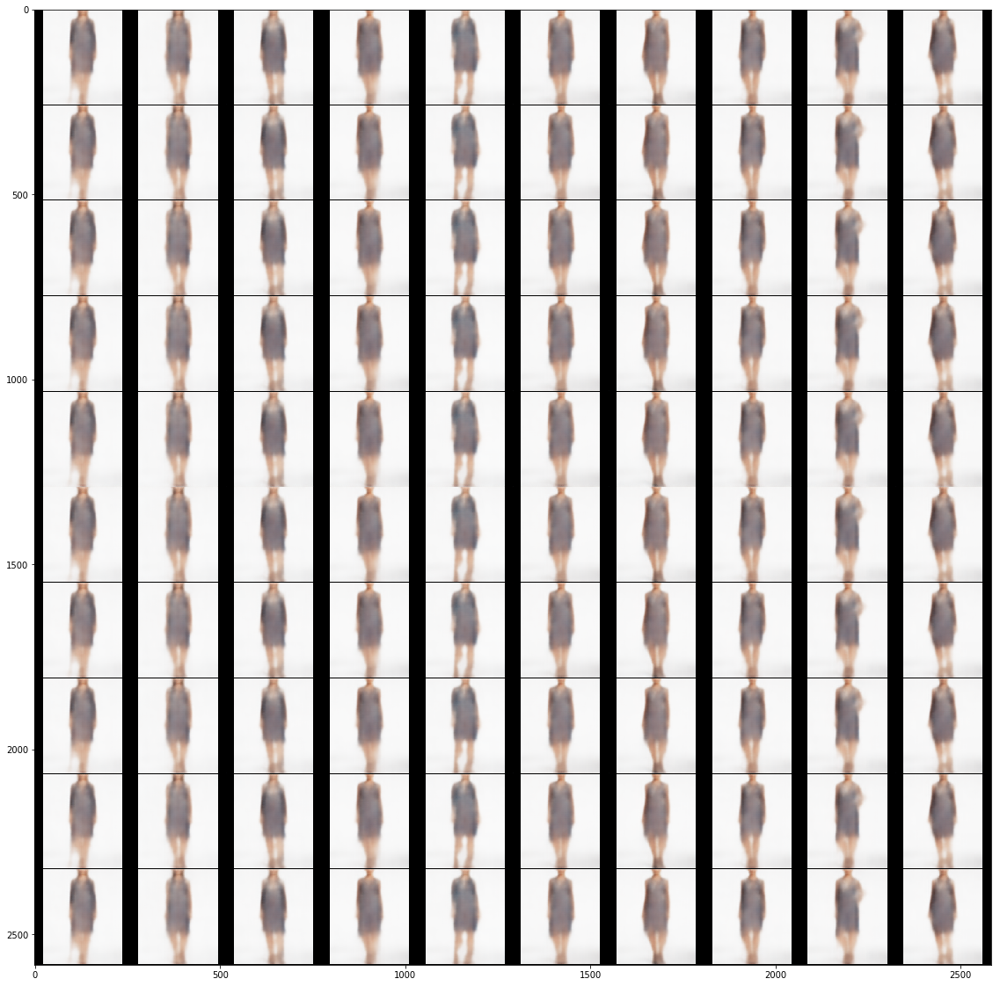

In [24]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=0, disc_idx=0, disc_axis=1, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals2001.png",dpi=200)

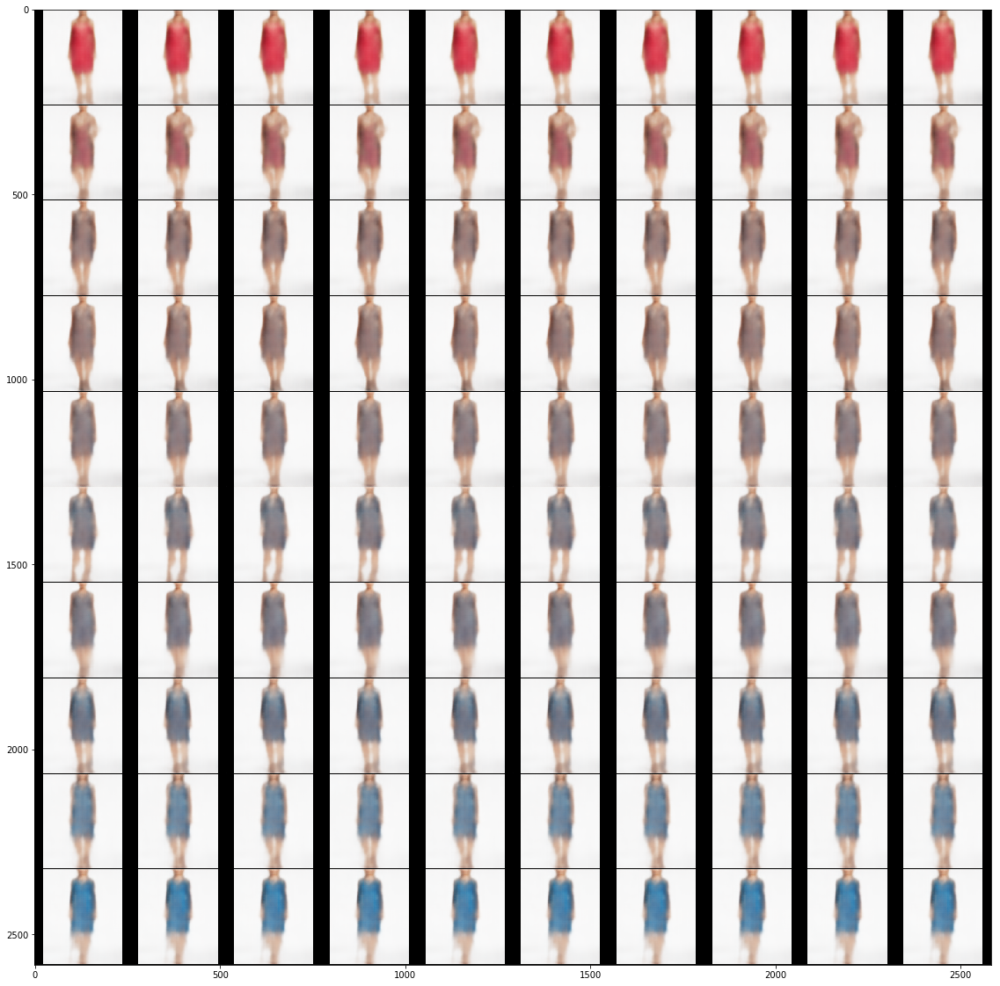

In [25]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=3, cont_axis=0, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals3000.png",dpi=200)

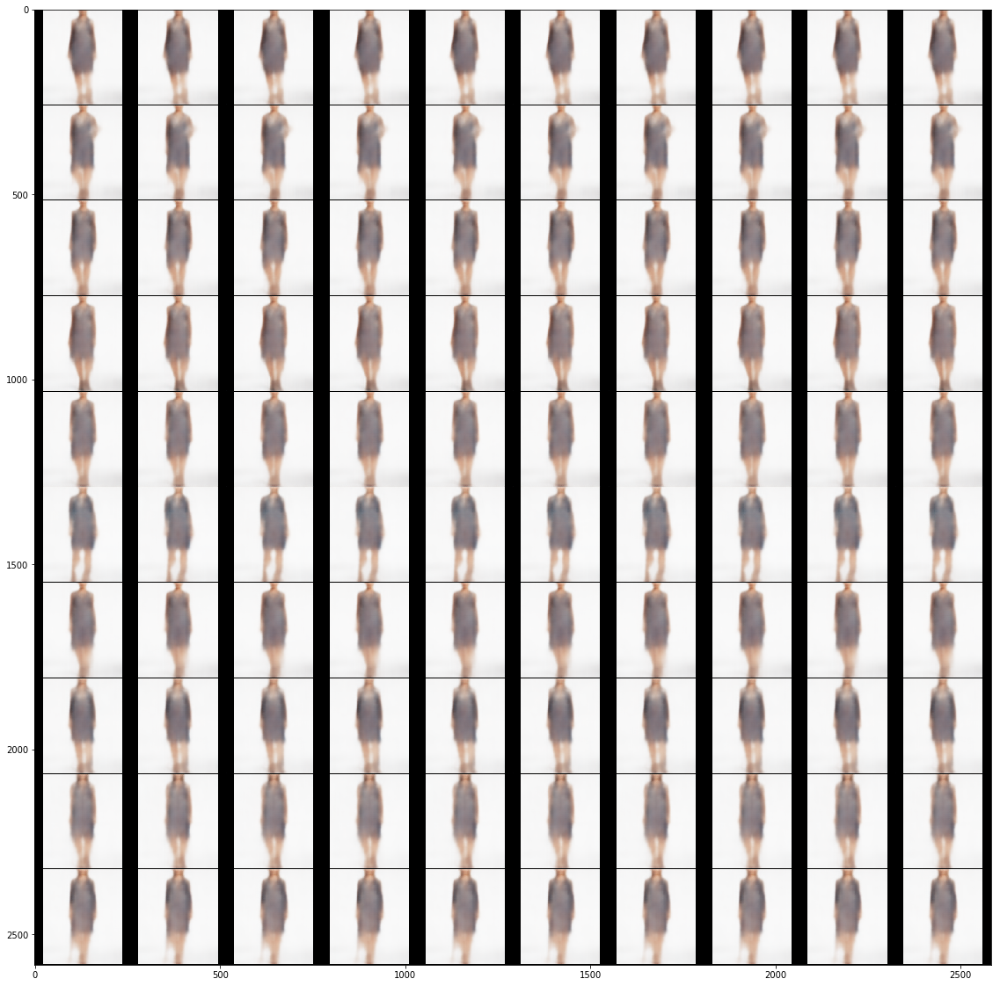

In [26]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=12, cont_axis=0, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals3000.png",dpi=200)

In [27]:
!ls

all_traversals.png
branch_test.ipynb
data
dataloading_pytorch_test.ipynb
imgs
jointvae
latent_traversals.py
load_model.ipynb
main.py
model_size_debug.txt
old_train_305_256_convjump2bn_gpu0.ipynb
old_train_305_256_convjump2bn_gpu1.ipynb
old_train_305_256_xint_gpu0.ipynb
old_train_305_256_xint_gpu1_3opdata.ipynb
__pycache__
RandomUtilsandTests.ipynb
README.md
requirements.txt
sample_images
train_305_256_branching1_loadable_gpu1.ipynb
train_305_256_cj1_gpu0-Copy1.ipynb
train_305_256_cj1_gpu0.ipynb
train_305_256_convjump2bn_gpu0.ipynb
train_305_256_convjump2bn_gpu1.ipynb
train_305_256_convjump2bn_shoes_gpu1.ipynb
train_305_256_xint_gpu0-Copy1.ipynb
train_305_256_xint_gpu0.ipynb
train_305_256_xint_gpu1_3opdata.ipynb
train_306_128_xint_cp0.ipynb
train_306_128_xint_cp1.ipynb
train_306_256_convjump1_gpu0.ipynb
train_306_256_convjump1_gpu1.ipynb
train_308_256_xint_gpu1_3opdata.ipynb
trained_models
trained_modelsstatedict_cj2bn_hd512_e200_b50_30k5_2_c10d10_gam30.pth
trained_modelsstatedict_xint2

### Save Model

In [28]:
torch.save(model.state_dict(),"trained_models/" + "statedict_" + model_name) # save state dict
#torch.save(model, model_name) # save full model

In [29]:
print("Done training: ",model_name)

Done training:  cj2_e89_b128_c20d10-10-10_cmax6_gam36


#### Restore Model from State Dict

In [ ]:
sd_model = VAE(latent_spec=latent_spec, img_size=(3, 64, 64))
sd_model.load_state_dict(torch.load("statedict_" + model_name))

#### Restore Full Model
* Note in this case the serialized data is bound to the specific classes and exact directory strucutre used.

In [ ]:
full_model = torch.load(model_name)

In [ ]:
type(full_model)

In [ ]:
type(sd_model)

In [ ]:
!ls